In [1]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
%autoreload 2 

In [3]:
%matplotlib inline

In [4]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [5]:
import pandas as pd

In [6]:
path = "../../data/"

In [8]:
df = pd.read_hdf(path + "offset_stat_129.h5", "df")

In [1]:
import cPickle as pickle
import matplotlib.pyplot as plt
from scipy.stats.stats import pearsonr as PearsonR
import sys
import h5py
from matplotlib.mlab import bivariate_normal

In [10]:
sys.path.append("../")

In [11]:
import plot_gal_prop as pg
import extract_catalog as ec
import get_gal_centroids as get_gal

In [12]:
f = h5py.File("../../data/" + 
              "Illustris-1_fof_subhalo_myCompleteHaloCatalog_00135.hdf5")

In [19]:
f.keys()

[u'Group', u'Header', u'Subhalo']

In [21]:
R200C = f["Group"]['Group_R_Crit200'][:129]

```
clstDF_list = map(lambda i: ec.extract_clst(f, i), range(129))
clstDF_list[0].keys()
```

In [15]:
fhat_list = pickle.load(open(path + 'fhat_I_lum.pkl'))

In [14]:
fhat_list[0].keys()

['gridtype',
 'bandwidth_matrix_H',
 'peaks_ycoords',
 'peaks_xcoords',
 'gridded',
 'weight_w',
 'binned',
 'peaks_colIx',
 'names',
 'estimate',
 'data_x',
 'eval_points',
 'peaks_rowIx',
 'peaks_dens']

In [15]:
eval_points1 = fhat_list[0]["eval_points"][0]
eval_points2 = fhat_list[0]["eval_points"][1]

In [20]:
np.sum(mask) / 129.

1.0

### Look at the correlation of the relaxedness and the offset in R200C

```
pearsonr, pvalue = PearsonR(relaxedness_list, offset_list[:, 1])
print "pearson R coefficient is {0}".format(pearsonr)
print "p value is ... {0}".format(pvalue)
#plt.semilogy(relaxedness_list, offset_list[:, 0], 'r.', alpha=0.7)
plt.semilogy(relaxedness_list, offset_list[:, 0], 'b.', alpha=0.7)
plt.xlabel("non-relaxedness criteria 1")
plt.ylabel("offset in terms of kpc / h ")
plt.title("Pearson R correlation for data " + 
          "= {0:.2f}".format(pearsonr))
plt.savefig("../plots/relaxednessVSOffsetInR200C.png", 
            bbox_inches="tight", dpi=200)
```

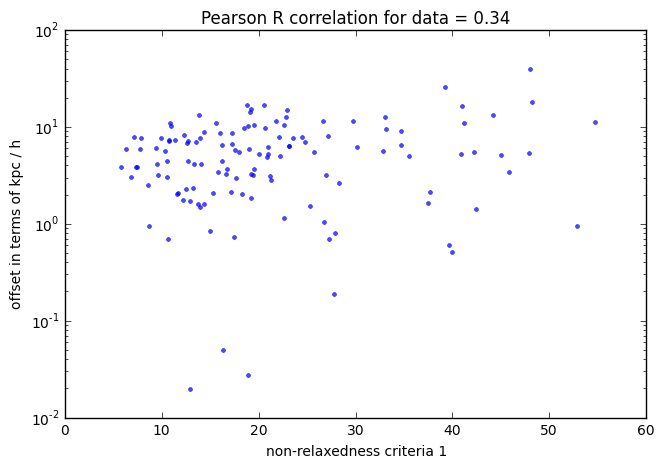

not very correlated ... 

# Look at the KDE maps from ks_KDE.r

examine 

In [17]:
fhat_dict = fhat_list

In [76]:
outliers = [i for i in range(df.shape[0])
            if df["offset_R200_I_lum"][i] > 0.20]

In [73]:
peaks_dens = [np.sum(fhat_dict[i]["peaks_dens"]) 
              for i in range(len(fhat_dict))]

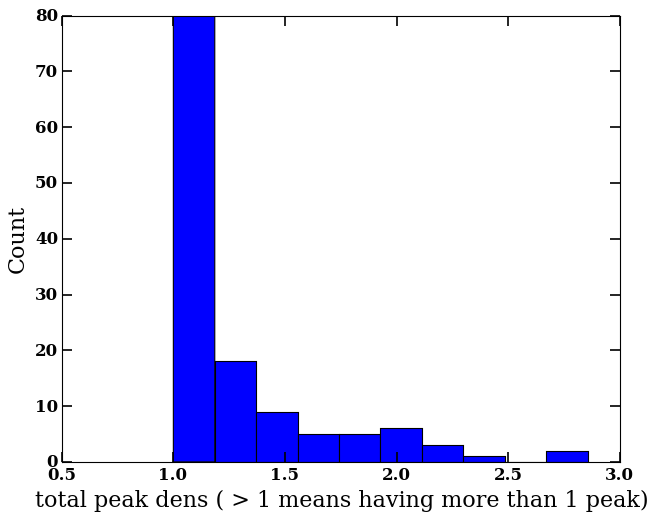

In [90]:
plt.hist(peaks_dens)
plt.xlabel('total peak dens ( > 1 means having more than 1 peak)')
plt.ylabel('Count')

In [74]:
potential_outliers = [i for i in range(df.shape[0])
                      if peaks_dens[i] > 1.5]

In [69]:
len(potential_outliers)

23

In [77]:
len(outliers)

11

In [80]:
intersect_guess = [i for i in outliers if i in potential_outliers]

In [81]:
len(intersect_guess)

9

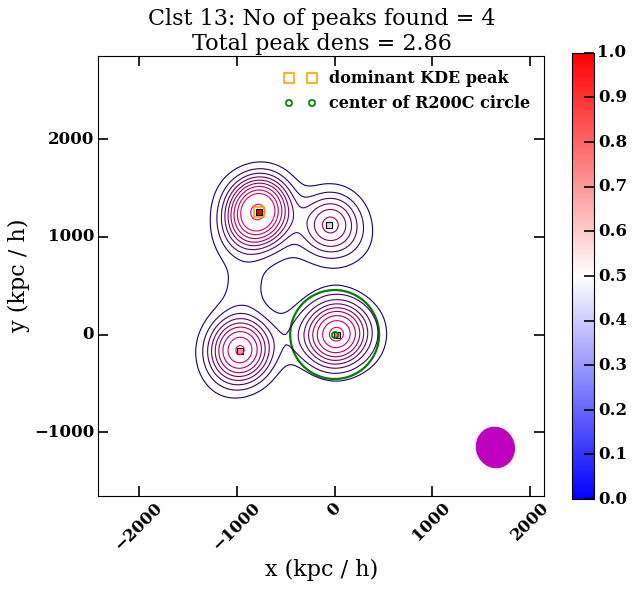

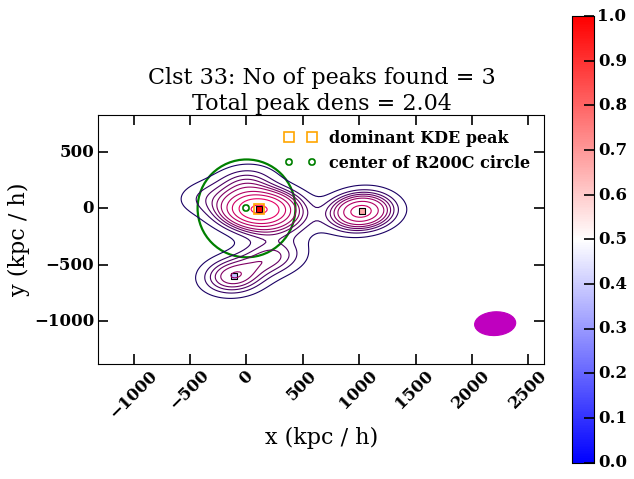

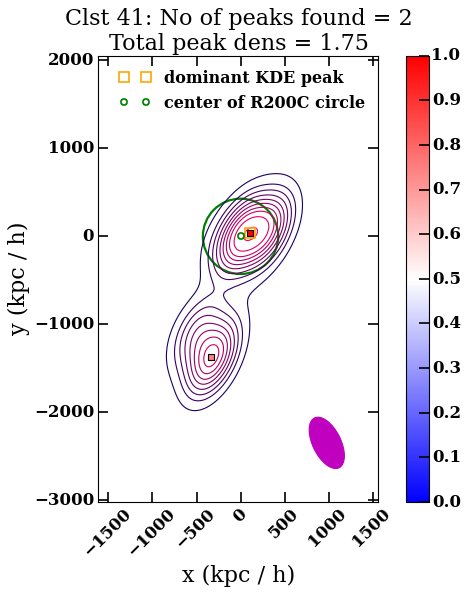

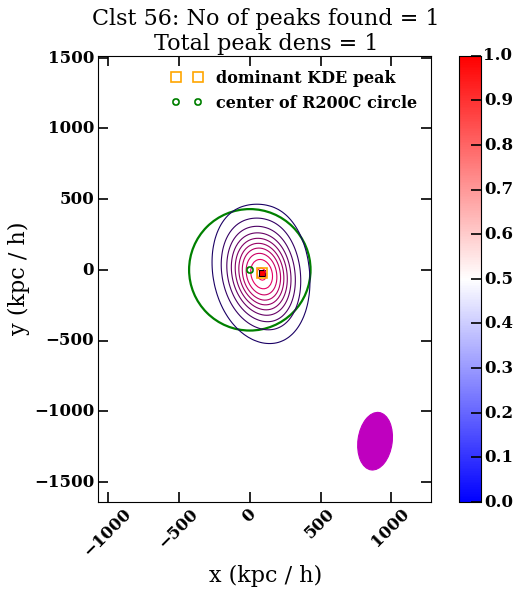

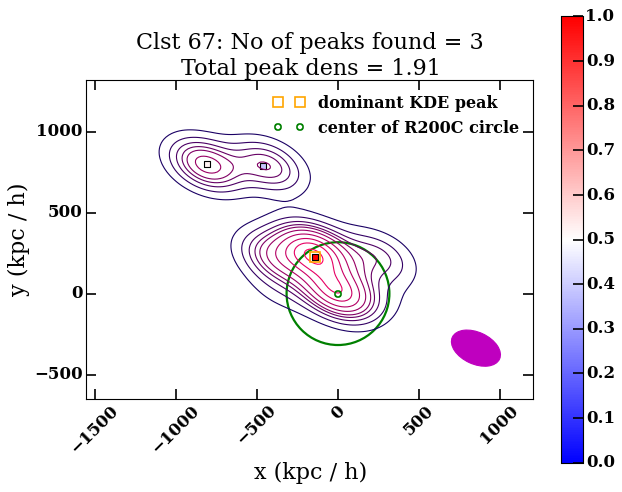

...

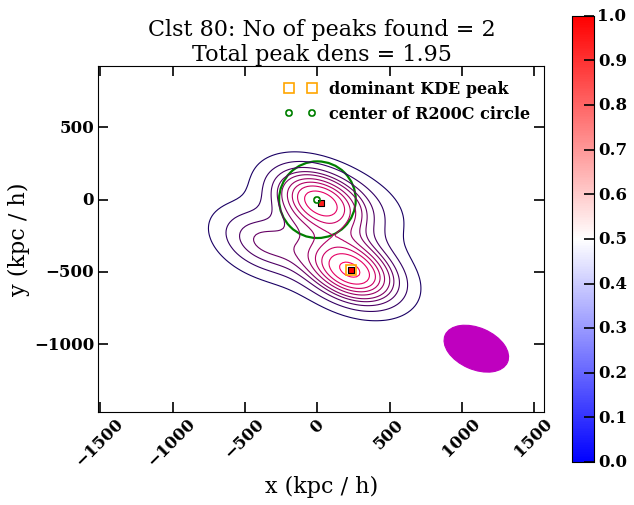

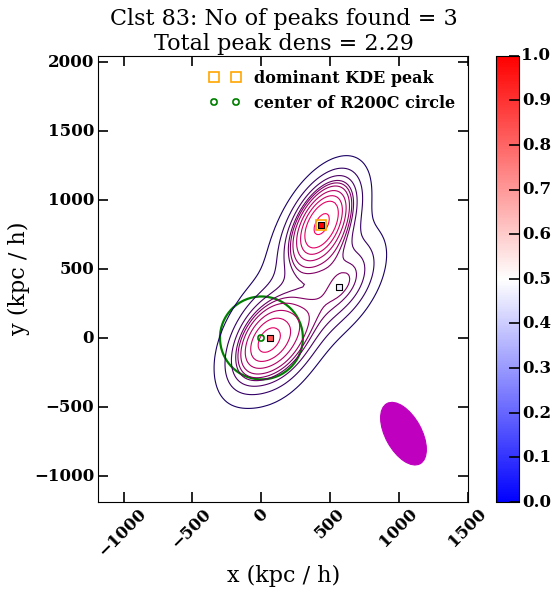

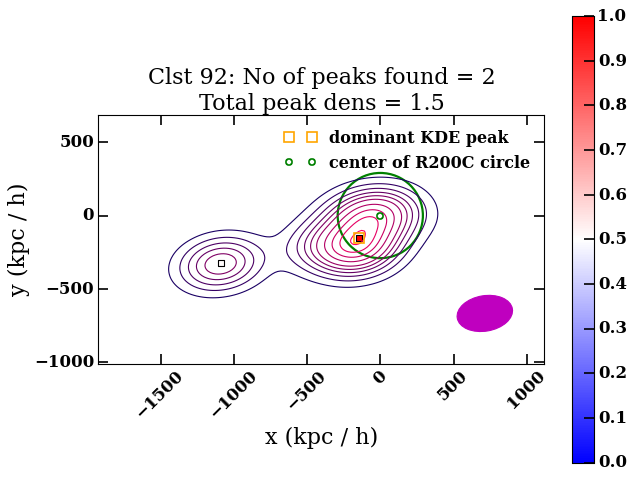

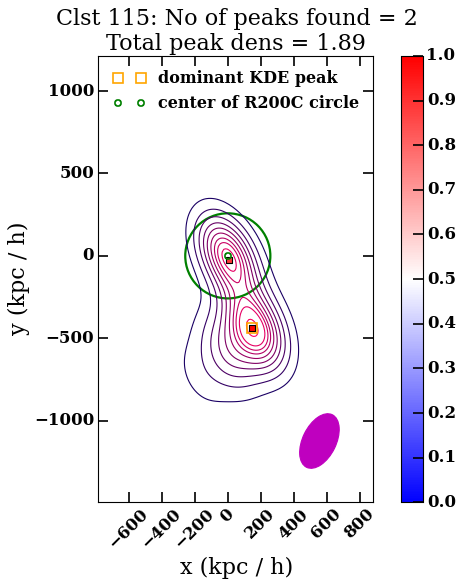

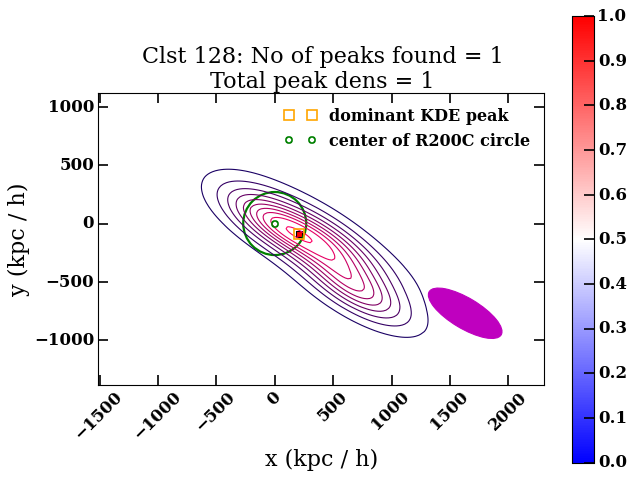

In [88]:
for i in outliers:
    pg.plot_KDE_peaks(fhat_dict[i], allPeaks=True, 
                      R200C=R200C[i], showData=True,
                      clstNo=i)
    plt.close()

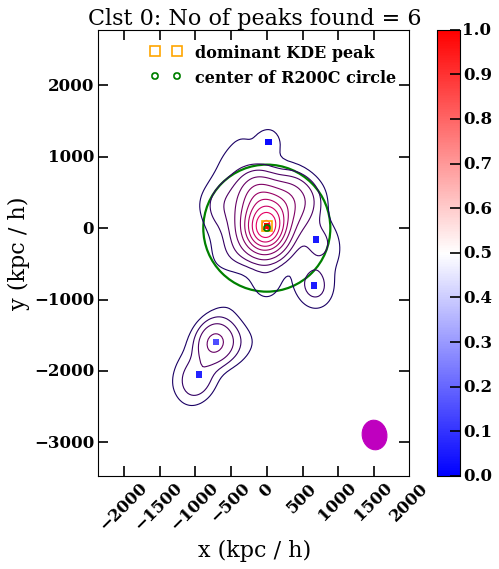

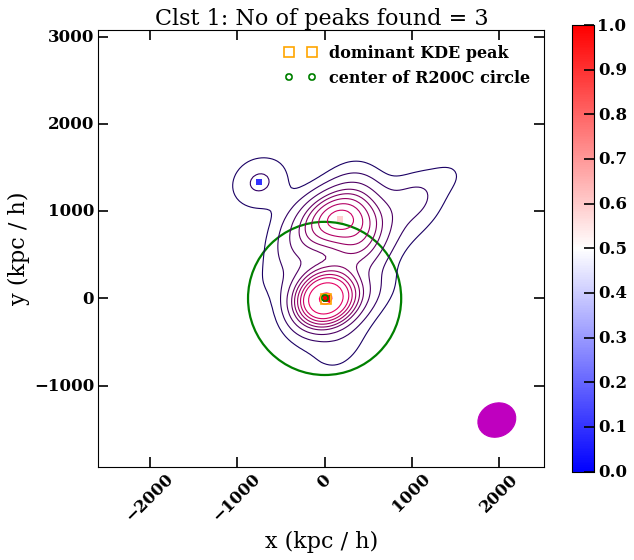

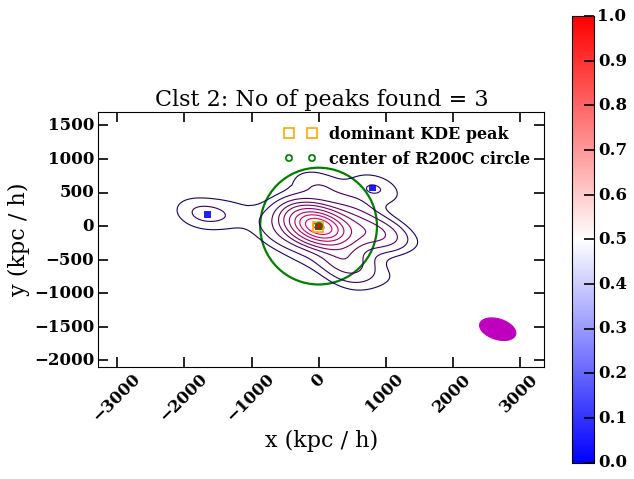

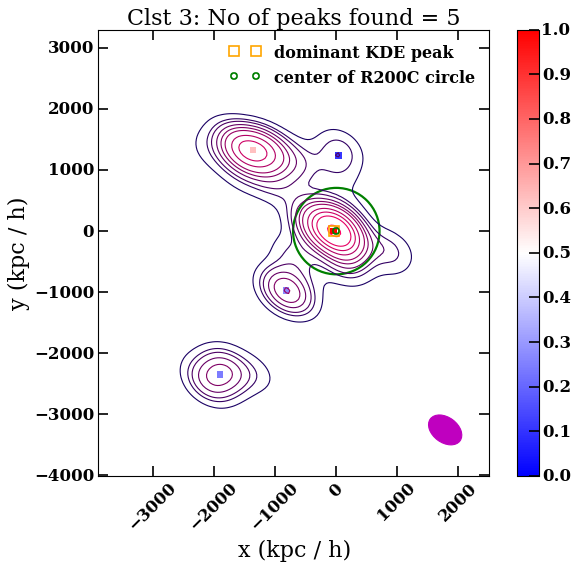

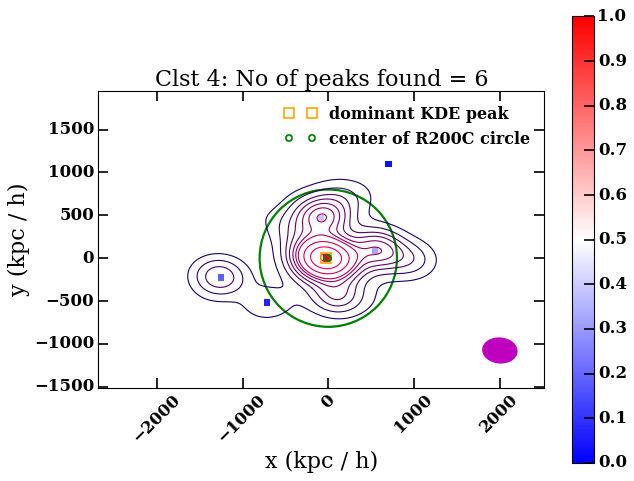

...

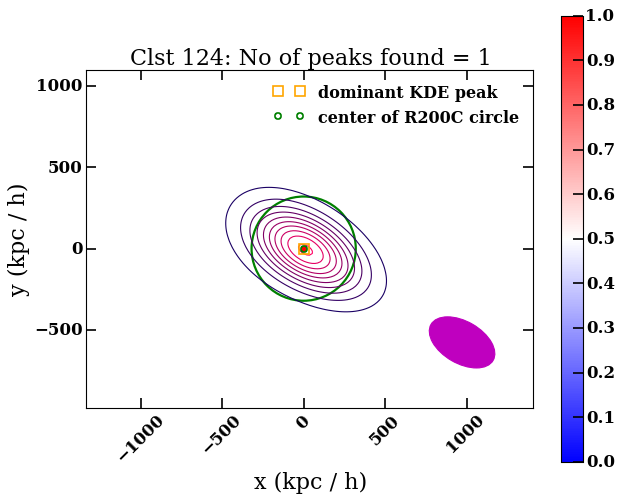

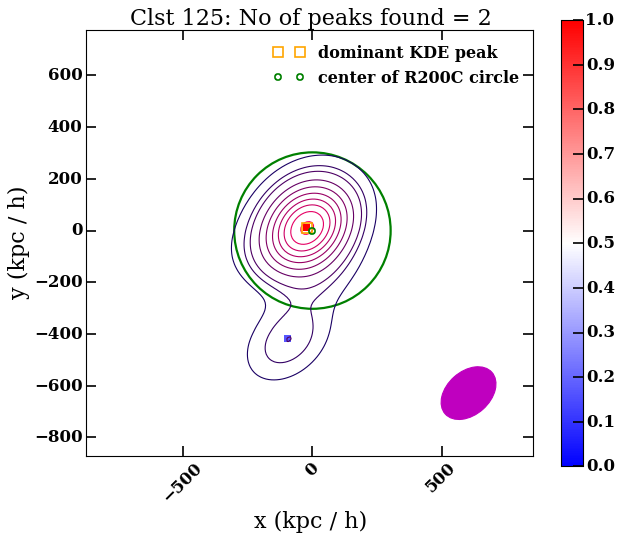

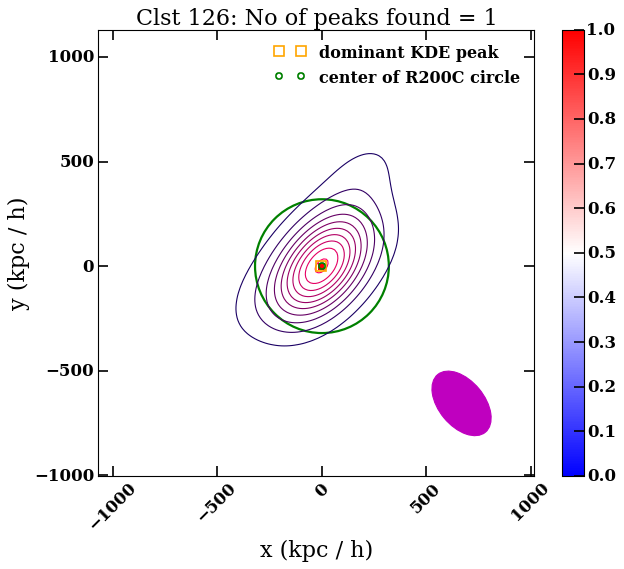

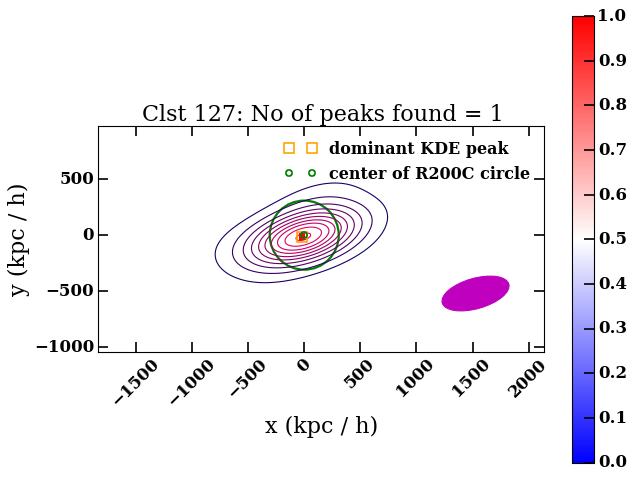

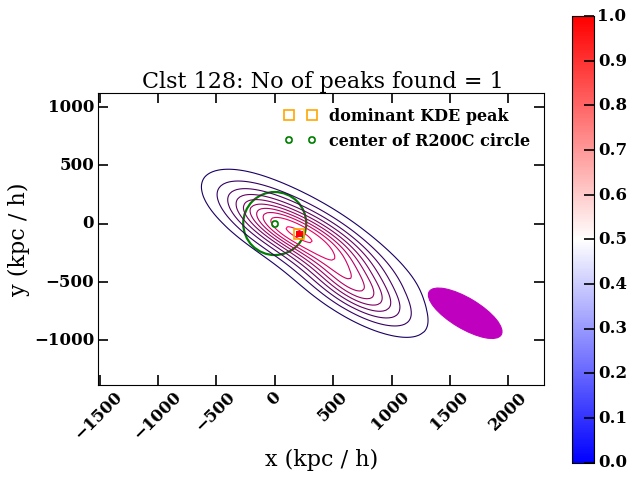

In [45]:
for i in range(129):    
    pg.plot_KDE_peaks(fhat_dict[i], allPeaks=True, 
                      R200C=R200C[i], showData=True,
                      clstNo=i)
    plt.close()

## Examine super outlier i.e. offset > 2 * R200C

In [42]:
super_outlier_mask = offset_list[:, 1] > 2.0

In [43]:
peak_no_list = [len(fhat["peaks_dens"]) for fhat in fhat_list]

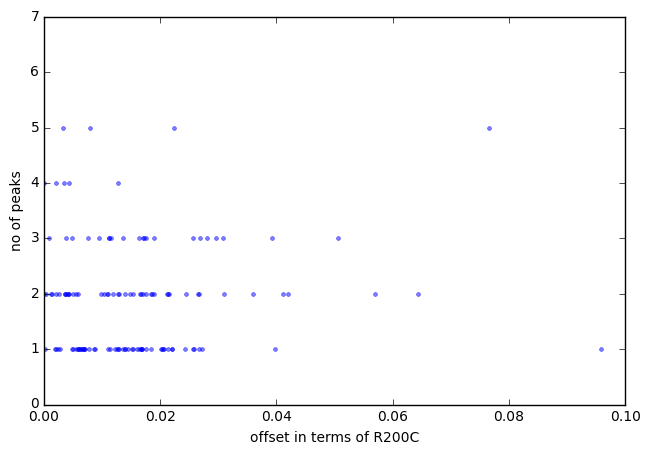

In [44]:
plt.plot(offset_list[:, 1], peak_no_list, ".", alpha=0.5)
plt.ylim((0, 7))
plt.xlabel('offset in terms of R200C')
plt.ylabel('no of peaks')
plt.savefig("../plots/peakNoVsoffsetR200C_no_weights.png",
            bbox_inches='tight')


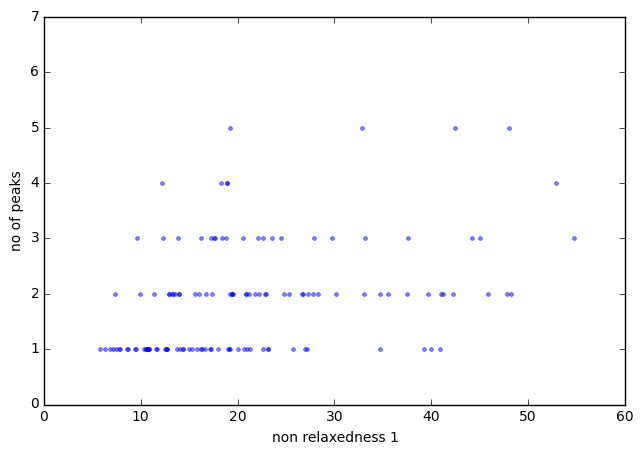

In [45]:
plt.plot(relaxedness_list, peak_no_list, ".", alpha=0.5)
plt.ylim((0, 7))
plt.xlabel('non relaxedness 1')
plt.ylabel('no of peaks')
plt.savefig("../plots/peakNoVsRelaxedness_no_weights.png",
            bbox_inches='tight')

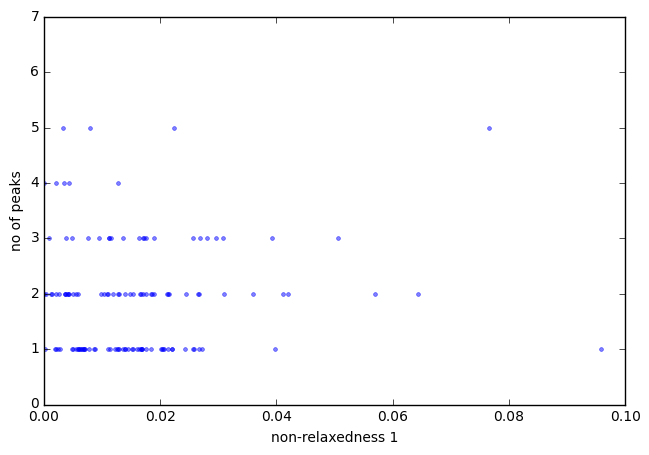

In [46]:
plt.plot(offset_list[:, 1], peak_no_list, ".", alpha=0.5)
plt.ylim((0, 7))
plt.xlabel('non-relaxedness 1')
plt.ylabel('no of peaks')

In [47]:
outlier_mask = np.logical_and(offset_list[:, 1] > 0.5, 
                              offset_list[:, 1] < 2.0)

In [48]:
fhat_dict[0].keys()

['gridtype',
 'bandwidth_matrix_H',
 'peaks_ycoords',
 'peaks_xcoords',
 'gridded',
 'weight_w',
 'binned',
 'peaks_colIx',
 'names',
 'estimate',
 'data_x',
 'eval_points',
 'peaks_rowIx',
 'peaks_dens']